# DSP 461 Project
---
## Contents:
### §1: Proof of Concept
### §2: Loading Data


# §1: Proof of Concept

In [1]:
!pip install h3 pandas geopandas folium

In [2]:
import pandas as pd
import geopandas as gpd # Import geopandas
from shapely.geometry import Point
import numpy as np
import random

# This placeholder data as the real dataset is going to slow things down a lot
# Define range for ELAPSETIME
start = 0
stop = 500

# Define bbox for RI
# Find the bbox for each state here: https://anthonylouisdagostino.com/bounding-boxes-for-all-us-states/
minx, miny = -71.862772, 41.146339
maxx, maxy = -71.120570, 42.018798

# Generate a list of random points within the bbox
points = [Point(random.uniform(minx,maxx), random.uniform(miny,maxy)) for _ in np.arange(10000)] # Changed minx to maxy here
gdf = gpd.GeoDataFrame({'ELAPSETIME': [random.randint(start, stop) for _ in np.arange(10000)],
                        'geometry': points}, crs='EPSG:4326')
gdf.head()

,ELAPSETIME,geometry
0,179,POINT (-71.15438 41.49318)
1,376,POINT (-71.71999 41.7709)
2,480,POINT (-71.8129 41.64908)
3,133,POINT (-71.38917 41.22003)
4,7,POINT (-71.43918 41.89312)


In [3]:
import h3

# Add hex col
res = 10
col = f'H3_{res}'

gdf[col] = gdf.apply(lambda row: str(h3.latlng_to_cell(row.geometry.y, row.geometry.x, res)), axis=1)

gdf.head()

,ELAPSETIME,geometry,H3_10
0,179,POINT (-71.15438 41.49318),8a2a33aca8affff
1,376,POINT (-71.71999 41.7709),8a2a330abc5ffff
2,480,POINT (-71.8129 41.64908),8a2a337283b7fff
3,133,POINT (-71.38917 41.22003),8a2a3324a6d7fff
4,7,POINT (-71.43918 41.89312),8a2a3310c6affff


In [4]:
# Aggregate by H3 cell
h3_df = gdf.groupby(col)['ELAPSETIME'].describe().reset_index()

h3_df.head()

,H3_10,count,mean,std,min,25%,50%,75%,max
0,8a2a06500007fff,1.0,49.0,NaN,49.0,49.0,49.0,49.0,49.0
1,8a2a06500107fff,1.0,307.0,NaN,307.0,307.0,307.0,307.0,307.0
2,8a2a06500297fff,1.0,273.0,NaN,273.0,273.0,273.0,273.0,273.0
3,8a2a06500757fff,1.0,328.0,NaN,328.0,328.0,328.0,328.0,328.0
4,8a2a06500a27fff,1.0,11.0,NaN,11.0,11.0,11.0,11.0,11.0


In [5]:
# Convert to polygon
from shapely.geometry import Polygon
import h3

def cell_to_shapely(cell):
    coords = h3.cell_to_boundary(cell) # Use cell_to_boundary for polygon coordinates
    flipped = tuple(coord[::-1] for coord in coords) # lat,lng is y,x but we need x,y for polygonal conversion
    return Polygon(flipped)

In [6]:
# Create a brand new gdf from the aggregated information
h3_geoms = h3_df[col].apply(lambda x: cell_to_shapely(x))
h3_gdf = gpd.GeoDataFrame(data=h3_df, geometry=h3_geoms, crs=4326)

h3_gdf.head()

,H3_10,count,mean,std,min,25%,50%,75%,max,geometry
0,8a2a06500007fff,1.0,49.0,NaN,49.0,49.0,49.0,49.0,49.0,"POLYGON ((-71.2576 41.15448, -71.25852 41.1543..."
1,8a2a06500107fff,1.0,307.0,NaN,307.0,307.0,307.0,307.0,307.0,"POLYGON ((-71.25539 41.15714, -71.25632 41.157..."
2,8a2a06500297fff,1.0,273.0,NaN,273.0,273.0,273.0,273.0,273.0,"POLYGON ((-71.26143 41.14689, -71.26235 41.146..."
3,8a2a06500757fff,1.0,328.0,NaN,328.0,328.0,328.0,328.0,328.0,"POLYGON ((-71.26353 41.14954, -71.26445 41.149..."
4,8a2a06500a27fff,1.0,11.0,NaN,11.0,11.0,11.0,11.0,11.0,"POLYGON ((-71.24564 41.15262, -71.24657 41.152..."


In [7]:
import folium

# Center the map around Providence
m = folium.Map(location=[41.8236, -71.4222], zoom_start=12)

# Add polygons to the map
for idx, row in h3_gdf.iterrows():
    folium.GeoJson(row.geometry).add_to(m)

# Display the map
m

In [8]:
# although this works for real data, it is not quite right since we want to have
# an exact boundary for our distribution of data. we can use cartopy library's
# 'cfeature' method to retrieve the exact bounding regions of specific locations
# of interest. Might be useful for comparing a sample with random distributions
# in hypothesis testing

# §2: Loading Data
---
We have decided to use the GCS api in order to handle most of the queries needed for our project.
First, we need to load the data into the workspace:

In [12]:
# Setup Google Cloud credentials
import os
# os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/path/to/your/service-account-key.json"

# Store the service key in the corresponding location in colab files
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/Users/kamronaggor/Desktop/Desktop/Manual Library/School/URI/Fall 2025/DSP 461/Machine-Learning-Final/credentials/machine-learning-final-477822-031ba3aac2f9.json'

In [13]:
from dotenv import load_dotenv
import os
load_dotenv()

from google.cloud import bigquery
client = bigquery.Client(project="machine-learning-final-477822")

In [14]:
import pandas as pd

In [15]:
# Get table dimensions and shape
query = """
SELECT
    COUNT(*) as total_rows
    FROM `bigquery-public-data.census_bureau_acs.censustract_2020_5yr`
"""
query_job = client.query(query)
results = query_job.result()
for row in results:
    print(f"Total rows: {row.total_rows}")

# Now Filter for Rhode Island
query = """
SELECT
    COUNT(*) as total_rows
    FROM `bigquery-public-data.census_bureau_acs.censustract_2020_5yr`
    WHERE geo_id LIKE '44%'
"""
query_job = client.query(query)
results = query_job.result()
for row in results:
    print(f"Total rows: {row.total_rows}")


Total rows: 85395
Total rows: 250


**This means that our sample is going to be 250 Census tracts in RI.**

In [16]:
query = """
SELECT
  geo_id,
  median_rent,
  median_income,
  percent_income_spent_on_rent,
  rent_over_50_percent,
  rent_40_to_50_percent,
  rent_35_to_40_percent,
  rent_30_to_35_percent,
  renter_occupied_housing_units_paying_cash_median_gross_rent,
  poverty,
  gini_index,
  unemployed_pop,
  civilian_labor_force,
  occupied_housing_units,
  owner_occupied_housing_units,
  housing_units_renter_occupied,
  vacant_housing_units,
  median_year_structure_built,
  total_pop,
  median_age,
  bachelors_degree,
  graduate_professional_degree,
  less_than_high_school_graduate,
  white_pop,
  black_pop,
  hispanic_pop,
  asian_pop,
  -- Derived label
  CASE
    WHEN percent_income_spent_on_rent >= 30 THEN 1
    ELSE 0
  END AS high_rent_burden
FROM
  `bigquery-public-data.census_bureau_acs.censustract_2020_5yr`
WHERE
  geo_id LIKE '44%'  -- Rhode Island tracts
"""
query_job = client.query(query)
results = query_job.result()
ri_rent_df = results.to_dataframe()
ri_rent_df.head()

/Users/kamronaggor/Desktop/Desktop/Manual Library/School/URI/Fall 2025/DSP 461/Machine-Learning-Final/.venv/lib/python3.13/site-packages/google/cloud/bigquery/table.py:1994: UserWarning: BigQuery Storage module not found, fetch data with the REST endpoint instead.
  warnings.warn(


,geo_id,median_rent,median_income,percent_income_spent_on_rent,rent_over_50_percent,rent_40_to_50_percent,rent_35_to_40_percent,rent_30_to_35_percent,renter_occupied_housing_units_paying_cash_median_gross_rent,poverty,...,total_pop,median_age,bachelors_degree,graduate_professional_degree,less_than_high_school_graduate,white_pop,black_pop,hispanic_pop,asian_pop,high_rent_burden
0,44001030100,1214.0,NaN,51.0,146.0,12.0,5.0,12.0,1294.0,425.0,...,4482.0,41.2,927.0,1110.0,71.0,3890.0,41.0,124.0,113.0,1
1,44001030200,961.0,NaN,34.8,66.0,4.0,34.0,40.0,1325.0,100.0,...,3129.0,43.6,652.0,790.0,127.0,2866.0,0.0,154.0,42.0,1
2,44001030300,1132.0,NaN,20.7,14.0,8.0,0.0,0.0,1382.0,269.0,...,4496.0,43.5,1004.0,1129.0,38.0,3927.0,78.0,147.0,214.0,0
3,44001030400,2741.0,NaN,51.0,34.0,0.0,0.0,0.0,3074.0,80.0,...,3992.0,45.3,940.0,1345.0,30.0,3632.0,1.0,147.0,160.0,1
4,44001030500,757.0,NaN,31.8,272.0,75.0,97.0,156.0,906.0,494.0,...,3090.0,46.8,639.0,199.0,325.0,2913.0,30.0,85.0,9.0,1


## Loading DP05 Data

In [18]:
# Get table dimensions and shape
query = """
SELECT
    COUNT(*) as total_rows
    FROM `bigquery-public-data.census_bureau_acs.cbsa_2020_5yr`
"""
query_job = client.query(query)
results = query_job.result()
for row in results:
    print(f"Total rows: {row.total_rows}")

# Now Filter for Rhode Island
query = """
SELECT
    COUNT(*) as total_rows
    FROM `bigquery-public-data.census_bureau_acs.cbsa_2020_5yr`
    WHERE geo_id LIKE '44%'
"""
query_job = client.query(query)
results = query_job.result()
ri_rent_df_dp05 = results.to_dataframe()

print(f"Total rows: {len(ri_rent_df_dp05)}")
ri_rent_df_dp05.head()

Total rows: 939
Total rows: 1


,total_rows
0,23


# §3: Data Cleaning

In [21]:
# Dim and shape
ri_rent_df.size
ri_rent_df.shape
ri_rent_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250 entries, 0 to 249
Data columns (total 28 columns):
 #   Column                                                       Non-Null Count  Dtype  
---  ------                                                       --------------  -----  
 0   geo_id                                                       250 non-null    object 
 1   median_rent                                                  250 non-null    float64
 2   median_income                                                0 non-null      float64
 3   percent_income_spent_on_rent                                 250 non-null    float64
 4   rent_over_50_percent                                         250 non-null    float64
 5   rent_40_to_50_percent                                        250 non-null    float64
 6   rent_35_to_40_percent                                        250 non-null    float64
 7   rent_30_to_35_percent                                        250 non-null    flo

Thanks to what I've learned from reading up on Sentinel Codes, we can immediately impute a new col:

In [22]:
ri_rent_df["county_fips"] = ri_rent_df["geo_id"].str[:5] # We can now visualize by county

(array([  8.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0., 242.]),
 array([-6.66666666e+08, -6.44444352e+08, -6.22222039e+08, -5.99999725e+08,
        -5.77777412e+08, -5.55555098e+08, -5.33332785e+08, -5.11110471e+08,
        -4.88888157e+08, -4.66665844e+08, -4.44443530e+08, -4.22221217e+08,
        -3.99998903e+08, -3.77776590e+08, -3.55554276e+08, -3.33331962e+08,
        -3.11109649e+08, -2.88887335e+08, -2.66665022e+08, -2.44442708e+08,
        -2.22220395e+08, -1.99998081e+08, -1.77775768e+08, -1.55553454e+08,
        -1.33331140e+08, -1.11108827e+08, -8.88865133e+07, -6.66641997e+07,
        -4.44418861e+07, -2.22195726e+07,  2.74100000e+03]),
 <BarContainer object of 30 artists>)

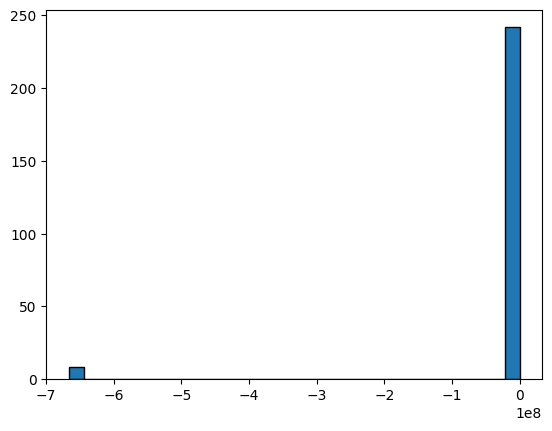

In [23]:
# Take a look at median_rent distribution
import matplotlib.pyplot as plt
plt.hist(ri_rent_df['median_rent'].dropna(), bins=30, edgecolor='k')

First, we need to remove the values that come up negative due to Sentinel codes. These can be dropped:

(array([ 2.,  3.,  6.,  7., 15., 41., 41., 32., 20., 15., 16., 12., 13.,
         8.,  2.,  2.,  1.,  2.,  2.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,
         0.,  0.,  0.,  1.]),
 array([ 340.        ,  420.03333333,  500.06666667,  580.1       ,
         660.13333333,  740.16666667,  820.2       ,  900.23333333,
         980.26666667, 1060.3       , 1140.33333333, 1220.36666667,
        1300.4       , 1380.43333333, 1460.46666667, 1540.5       ,
        1620.53333333, 1700.56666667, 1780.6       , 1860.63333333,
        1940.66666667, 2020.7       , 2100.73333333, 2180.76666667,
        2260.8       , 2340.83333333, 2420.86666667, 2500.9       ,
        2580.93333333, 2660.96666667, 2741.        ]),
 <BarContainer object of 30 artists>)

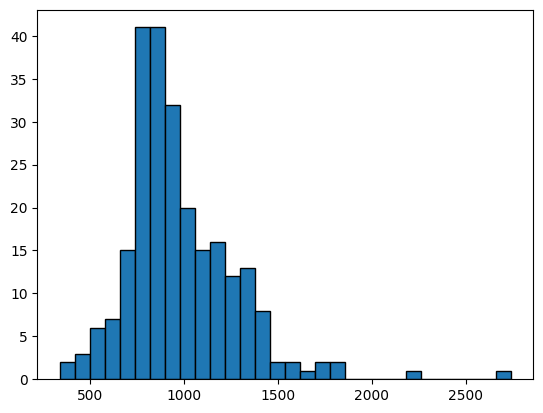

In [24]:
import numpy as np
ri_rent_df = ri_rent_df.map(lambda x: np.nan if isinstance(x, (int, float)) and x < 0 else x)

plt.hist(ri_rent_df['median_rent'].dropna(), bins=30, edgecolor='k', label='Median Rent Distribution')

Next is making sure that the numeric types are the same:

In [25]:
ri_rent_df.dtypes

geo_id                                                          object
median_rent                                                    float64
median_income                                                  float64
percent_income_spent_on_rent                                   float64
rent_over_50_percent                                           float64
rent_40_to_50_percent                                          float64
rent_35_to_40_percent                                          float64
rent_30_to_35_percent                                          float64
renter_occupied_housing_units_paying_cash_median_gross_rent    float64
poverty                                                        float64
gini_index                                                     float64
unemployed_pop                                                 float64
civilian_labor_force                                           float64
occupied_housing_units                                         float64
owner_

In [26]:
# We need to cast geo_id and high_rent_burden:
ri_rent_df["geo_id"] = ri_rent_df["geo_id"].astype(str)
ri_rent_df["high_rent_burden"] = ri_rent_df["high_rent_burden"].astype(int)

Some of these measures are not really useful as pure counts, such as `unemployment_pop`, `vacant_housing_units`, etc. This is because they will end up dominating the model and also make it difficult to generalize across other areas of the country. Rather, we should insert corresponding rates columns:

In [27]:
ri_rent_df["unemployment_rate"] = ri_rent_df["unemployed_pop"] / ri_rent_df["civilian_labor_force"]
ri_rent_df["vacancy_rate"] = ri_rent_df["vacant_housing_units"] / ri_rent_df["occupied_housing_units"]
ri_rent_df["renter_share"] = ri_rent_df["housing_units_renter_occupied"] / ri_rent_df["occupied_housing_units"]

Another issue to account for in this step is how predictors will weight numerical values. For instance, columns like `gini_index` and the rates we just defined will contain small numbers while populations will contain large scalars.

In [29]:
ri_rent_df_scaled = ri_rent_df.copy()

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numerical_cols = ri_rent_df_scaled.select_dtypes(include=[np.number]).columns.drop("high_rent_burden")
ri_rent_df_scaled[numerical_cols] = scaler.fit_transform(ri_rent_df_scaled[numerical_cols])

ri_rent_df_scaled.head()

/Users/kamronaggor/Desktop/Desktop - Mac mini (646)/Manual Library/School/URI/Fall 2025/DSP 461/Machine-Learning-Final/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:1144: RuntimeWarning: invalid value encountered in divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/kamronaggor/Desktop/Desktop - Mac mini (646)/Manual Library/School/URI/Fall 2025/DSP 461/Machine-Learning-Final/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:1149: RuntimeWarning: invalid value encountered in divide
  T = new_sum / new_sample_count
/Users/kamronaggor/Desktop/Desktop - Mac mini (646)/Manual Library/School/URI/Fall 2025/DSP 461/Machine-Learning-Final/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:1169: RuntimeWarning: invalid value encountered in divide
  new_unnormalized_variance -= correction**2 / new_sample_count


,geo_id,median_rent,median_income,percent_income_spent_on_rent,rent_over_50_percent,rent_40_to_50_percent,rent_35_to_40_percent,rent_30_to_35_percent,renter_occupied_housing_units_paying_cash_median_gross_rent,poverty,...,less_than_high_school_graduate,white_pop,black_pop,hispanic_pop,asian_pop,high_rent_burden,county_fips,unemployment_rate,vacancy_rate,renter_share
0,44001030100,0.784827,NaN,2.980571,0.090936,-0.671657,-0.766535,-0.771224,0.561361,-0.106036,...,-0.952339,0.518044,-0.605903,-0.587183,-0.172487,1,44001,-0.437258,-0.407463,-1.068753
1,44001030200,-0.074730,NaN,0.713396,-0.618396,-0.809150,-0.142811,-0.281514,0.662935,-0.852931,...,-0.739042,-0.093691,-0.734140,-0.555039,-0.575016,1,44001,-0.602598,-0.432287,-0.794128
2,44001030300,0.506236,NaN,-1.259886,-1.079463,-0.740404,-0.874073,-0.981100,0.849698,-0.464546,...,-1.078032,0.540147,-0.490177,-0.562539,0.400125,0,44001,-0.815356,-0.248510,-1.347801
3,44001030400,5.972750,NaN,2.980571,-0.902130,-0.877897,-0.874073,-0.981100,6.393636,-0.898894,...,-1.108503,0.363915,-0.731012,-0.562539,0.093976,1,44001,-1.484963,-0.318302,-1.488810
4,44001030500,-0.767812,NaN,0.293549,1.208136,0.411106,1.212174,1.747287,-0.709944,0.052535,...,0.015114,-0.065613,-0.640308,-0.628969,-0.762107,1,44001,-0.314463,-0.228554,1.272194


Given that the `median_income` column is entirely `NaN`, it's best to drop it so that we can avoid Runtime errors. We can then re-run the scaling on the remaining numerical columns.

In [30]:
ri_rent_df_scaled = ri_rent_df.drop(columns=['median_income'])

Now, let's re-apply the scaler to the updated DataFrame:

In [31]:
from sklearn.preprocessing import StandardScaler
import numpy as np # Ensure numpy is imported

scaler = StandardScaler()
# Exclude 'high_rent_burden' as it's the target and 'geo_id' as it's an identifier
numerical_cols = ri_rent_df_scaled.select_dtypes(include=[np.number]).columns.drop("high_rent_burden")

# Identify columns with zero variance or all NaNs and exclude them from scaling
numerical_cols = numerical_cols[ri_rent_df_scaled[numerical_cols].notna().any()]

# For StandardScaler, it computes population variance for scaling, but a simple check for std == 0 is enough.
zero_variance_cols = numerical_cols[ri_rent_df_scaled[numerical_cols].std() == 0]

if not zero_variance_cols.empty:
    print(f"The following columns have zero variance and will not be scaled: {list(zero_variance_cols.values)}")
    numerical_cols = numerical_cols.drop(zero_variance_cols)

# Apply scaling only to the valid numerical columns
ri_rent_df_scaled[numerical_cols] = scaler.fit_transform(ri_rent_df_scaled[numerical_cols])

ri_rent_df_scaled.head()

,geo_id,median_rent,percent_income_spent_on_rent,rent_over_50_percent,rent_40_to_50_percent,rent_35_to_40_percent,rent_30_to_35_percent,renter_occupied_housing_units_paying_cash_median_gross_rent,poverty,gini_index,...,less_than_high_school_graduate,white_pop,black_pop,hispanic_pop,asian_pop,high_rent_burden,county_fips,unemployment_rate,vacancy_rate,renter_share
0,44001030100,0.784827,2.980571,0.090936,-0.671657,-0.766535,-0.771224,0.561361,-0.106036,0.704602,...,-0.952339,0.518044,-0.605903,-0.587183,-0.172487,1,44001,-0.437258,-0.407463,-1.068753
1,44001030200,-0.074730,0.713396,-0.618396,-0.809150,-0.142811,-0.281514,0.662935,-0.852931,-0.840016,...,-0.739042,-0.093691,-0.734140,-0.555039,-0.575016,1,44001,-0.602598,-0.432287,-0.794128
2,44001030300,0.506236,-1.259886,-1.079463,-0.740404,-0.874073,-0.981100,0.849698,-0.464546,-0.023596,...,-1.078032,0.540147,-0.490177,-0.562539,0.400125,0,44001,-0.815356,-0.248510,-1.347801
3,44001030400,5.972750,2.980571,-0.902130,-0.877897,-0.874073,-0.981100,6.393636,-0.898894,1.289255,...,-1.108503,0.363915,-0.731012,-0.562539,0.093976,1,44001,-1.484963,-0.318302,-1.488810
4,44001030500,-0.767812,0.293549,1.208136,0.411106,1.212174,1.747287,-0.709944,0.052535,0.589466,...,0.015114,-0.065613,-0.640308,-0.628969,-0.762107,1,44001,-0.314463,-0.228554,1.272194


...a nice result, but for EDA we will leave this for now.

Another potential problem is the introduction of colinear features into the model we will be constructing. The two I particularly want to be careful of are `median income` and `poverty`.

In [32]:
# Check for overlapping vars:
corr = ri_rent_df.corr()["high_rent_burden"].sort_values(ascending=False)
print(corr.head(10))

high_rent_burden                 1.000000
percent_income_spent_on_rent     0.732212
rent_over_50_percent             0.389817
rent_35_to_40_percent            0.307250
gini_index                       0.259175
rent_30_to_35_percent            0.258698
rent_40_to_50_percent            0.246989
poverty                          0.170465
housing_units_renter_occupied    0.161778
renter_share                     0.126066
Name: high_rent_burden, dtype: float64


Finally a consistency check for occupancy:

In [33]:
ri_rent_df["occupied_housing_units"].describe()

count     250.000000
mean     1658.920000
std       617.989812
min         0.000000
25%      1264.500000
50%      1664.500000
75%      2062.750000
max      3219.000000
Name: occupied_housing_units, dtype: float64

In [34]:
(ri_rent_df["owner_occupied_housing_units"] + ri_rent_df["housing_units_renter_occupied"]).describe()

# Good!

count     250.000000
mean     1658.920000
std       617.989812
min         0.000000
25%      1264.500000
50%      1664.500000
75%      2062.750000
max      3219.000000
dtype: float64

It would also be useful to create a dictionary for each of the county codes so that we can geocode our geo_ids and aggregate by county, but this will take time so we will return to it

# §4: Exploratory Data Analysis

### Distribution of `percent_income_spent_on_rent`

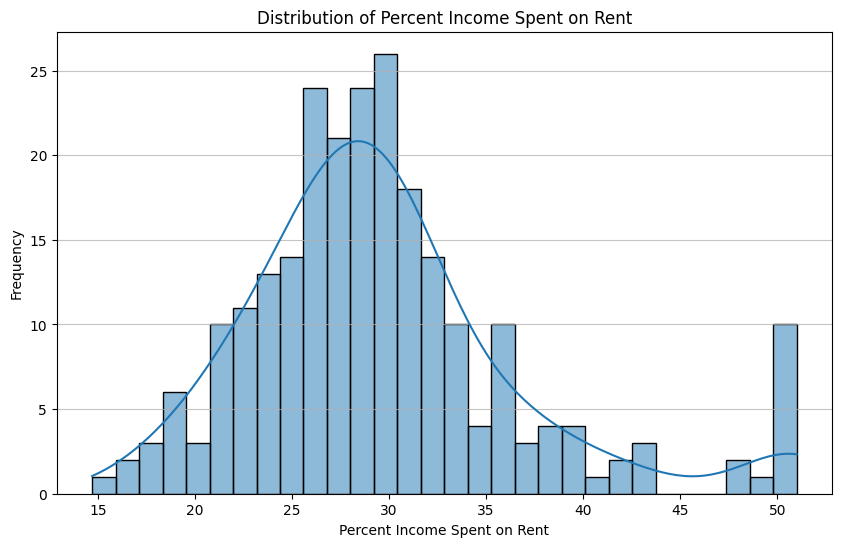

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(ri_rent_df['percent_income_spent_on_rent'].dropna(), kde=True, bins=30)
plt.title('Distribution of Percent Income Spent on Rent')
plt.xlabel('Percent Income Spent on Rent')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)
plt.show()

### Descriptive Statistics for `percent_income_spent_on_rent`

In [36]:
display(ri_rent_df['percent_income_spent_on_rent'].describe())

count    244.000000
mean      29.702459
std        7.160143
min       14.700000
25%       25.475000
50%       28.700000
75%       32.200000
max       51.000000
Name: percent_income_spent_on_rent, dtype: float64

This will give us a good initial understanding of the column. Next, we can look at potential outliers using a box plot and its relationship with the `high_rent_burden` target variable.

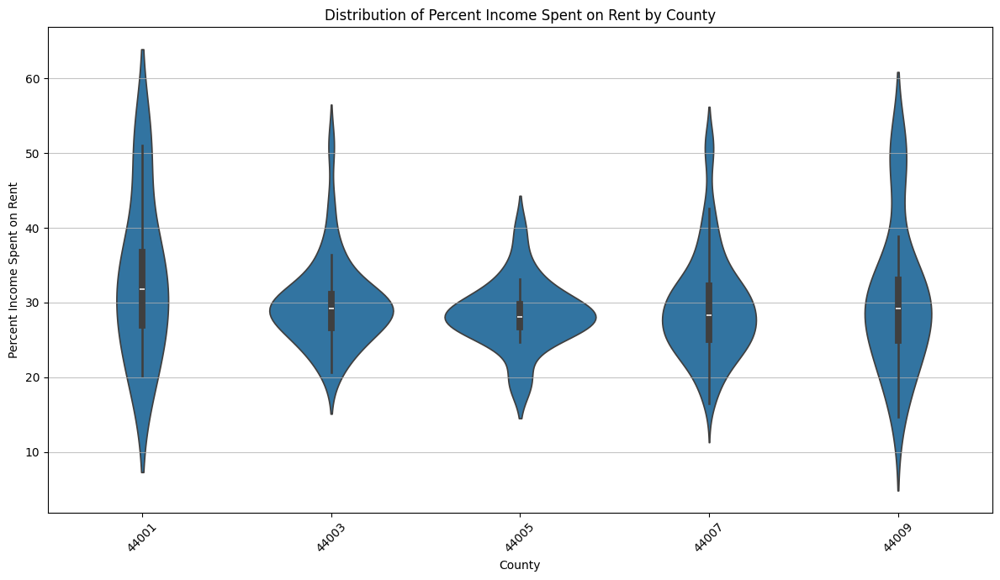

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 7))
sns.violinplot(x='county_fips', y='percent_income_spent_on_rent', data=ri_rent_df.dropna(subset=['percent_income_spent_on_rent', 'county_fips']))
plt.title('Distribution of Percent Income Spent on Rent by County')
plt.xlabel('County')
plt.ylabel('Percent Income Spent on Rent')
plt.grid(axis='y', alpha=0.75)
plt.xticks(rotation=45) # Rotate x-axis labels for better readability if many counties
plt.tight_layout()
plt.show()

#

### Correlation Matrix Heatmap

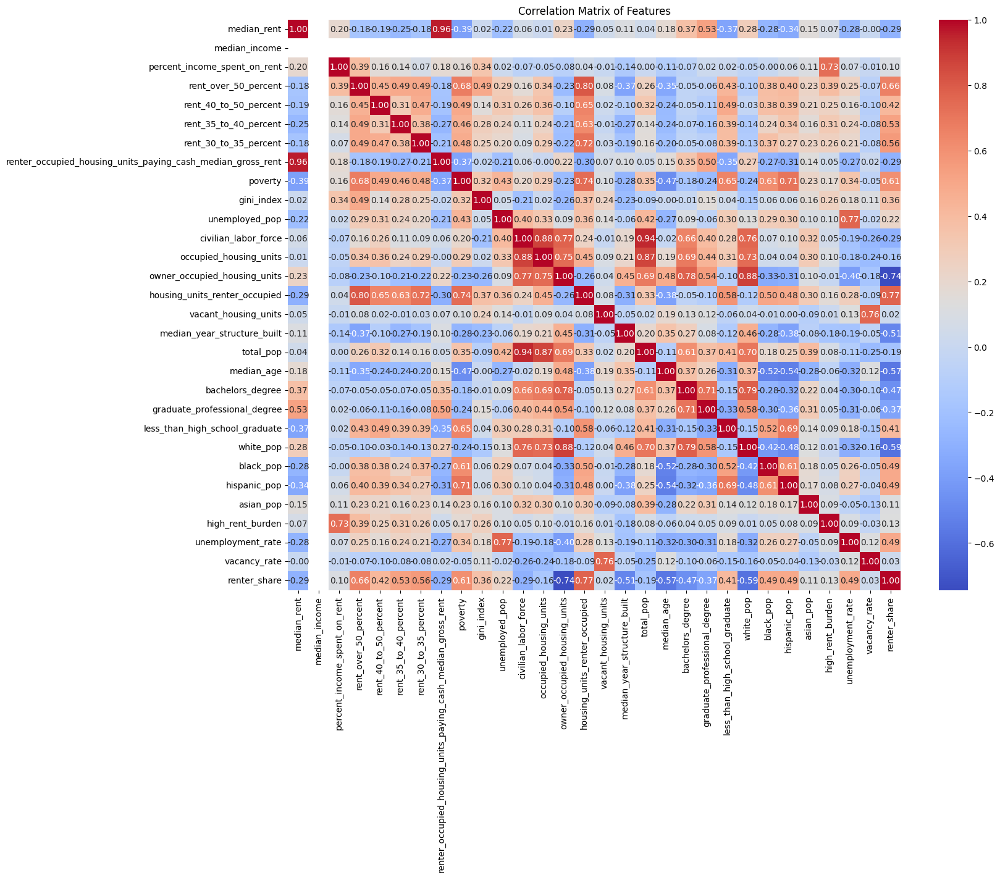

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16, 12))
sns.heatmap(ri_rent_df.corr(numeric_only=True), annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Features')
plt.show()

### High Rent Burden Distribution by County

/var/folders/nr/1wbv5xqn4jdg9fpmdqblsv_w0000gn/T/ipykernel_31674/2082278873.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='county_fips', y='high_rent_burden', data=ri_rent_df, palette='viridis')


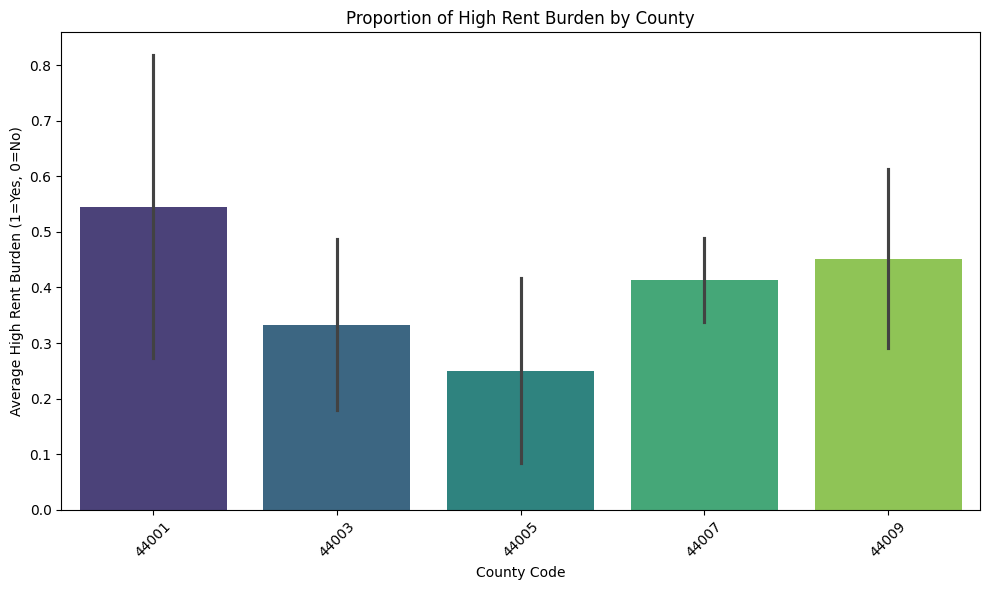

In [38]:
plt.figure(figsize=(10, 6))
sns.barplot(x='county_fips', y='high_rent_burden', data=ri_rent_df, palette='viridis')
plt.title('Proportion of High Rent Burden by County')
plt.xlabel('County Code')
plt.ylabel('Average High Rent Burden (1=Yes, 0=No)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Box Plots for Selected Features vs. High Rent Burden

/var/folders/nr/1wbv5xqn4jdg9fpmdqblsv_w0000gn/T/ipykernel_31674/576446889.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='high_rent_burden', y=feature, data=ri_rent_df, ax=axes[i], palette='plasma')
/var/folders/nr/1wbv5xqn4jdg9fpmdqblsv_w0000gn/T/ipykernel_31674/576446889.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='high_rent_burden', y=feature, data=ri_rent_df, ax=axes[i], palette='plasma')
/var/folders/nr/1wbv5xqn4jdg9fpmdqblsv_w0000gn/T/ipykernel_31674/576446889.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='

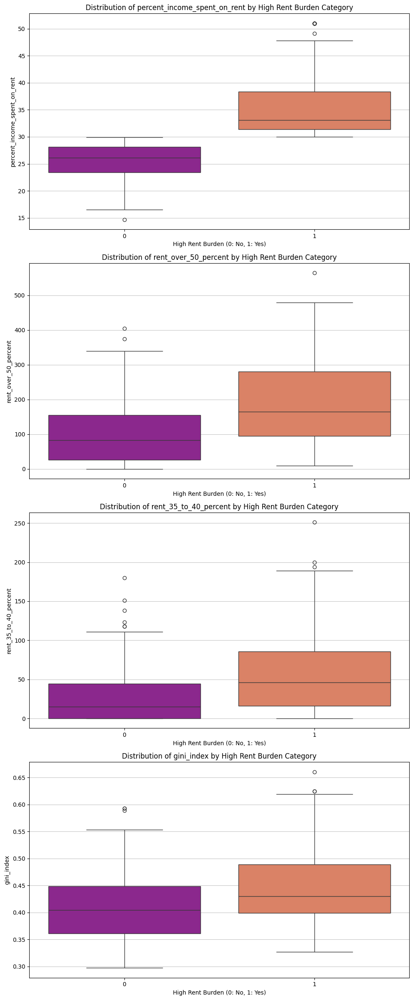

In [39]:
import numpy as np

# Identify top correlated features with 'high_rent_burden' (excluding itself and NaN columns)
correlation_with_target = ri_rent_df.corr(numeric_only=True)['high_rent_burden'].sort_values(ascending=False)
# Exclude high_rent_burden itself and any NaNs from the list
relevant_features = correlation_with_target.index[1:5] # Get top 4 most correlated features

fig, axes = plt.subplots(nrows=len(relevant_features), ncols=1, figsize=(10, 6 * len(relevant_features)))
axes = axes.flatten() # Ensure axes is always iterable

for i, feature in enumerate(relevant_features):
    sns.boxplot(x='high_rent_burden', y=feature, data=ri_rent_df, ax=axes[i], palette='plasma')
    axes[i].set_title(f'Distribution of {feature} by High Rent Burden Category')
    axes[i].set_xlabel('High Rent Burden (0: No, 1: Yes)')
    axes[i].set_ylabel(feature)
    axes[i].grid(axis='y', alpha=0.75)

plt.tight_layout()
plt.show()